In [10]:
import pandas as pd
import numpy as np
from datetime import datetime

def load_earthquake_data():
    try:
        # Read CSV into a DataFrame
        df = pd.read_csv('all_month.csv')
        
        # Convert numeric columns
        numeric_cols = ['latitude', 'longitude', 'depth', 'mag', 'nst', 'gap', 'dmin', 'rms', 
                        'horizontalError', 'depthError', 'magError', 'magNst']
        for col in numeric_cols:
            if col in df.columns:
                df[col] = pd.to_numeric(df[col], errors='coerce')
        
        # Convert time column
        if 'time' in df.columns:
            df['time'] = pd.to_datetime(df['time'], errors='coerce')
        
        return df
    except Exception as e:
        print("Error loading data:", e)
        return None


In [11]:
# Load the data
df = load_earthquake_data()

In [12]:
# Display basic information
print("Dataset Shape:", df.shape)
print("\nData Types:")
print(df.dtypes)

print("\nBasic Statistics:")
print(df.describe())

# Count missing values
print("\nMissing Values:")
missing_values = df.isnull().sum()
print(missing_values[missing_values > 0])


Dataset Shape: (10177, 22)

Data Types:
time               datetime64[ns, UTC]
latitude                       float64
longitude                      float64
depth                          float64
mag                            float64
magType                         object
nst                            float64
gap                            float64
dmin                           float64
rms                            float64
net                             object
id                              object
updated                         object
place                           object
type                            object
horizontalError                float64
depthError                     float64
magError                       float64
magNst                         float64
status                          object
locationSource                  object
magSource                       object
dtype: object

Basic Statistics:
           latitude     longitude         depth           mag        

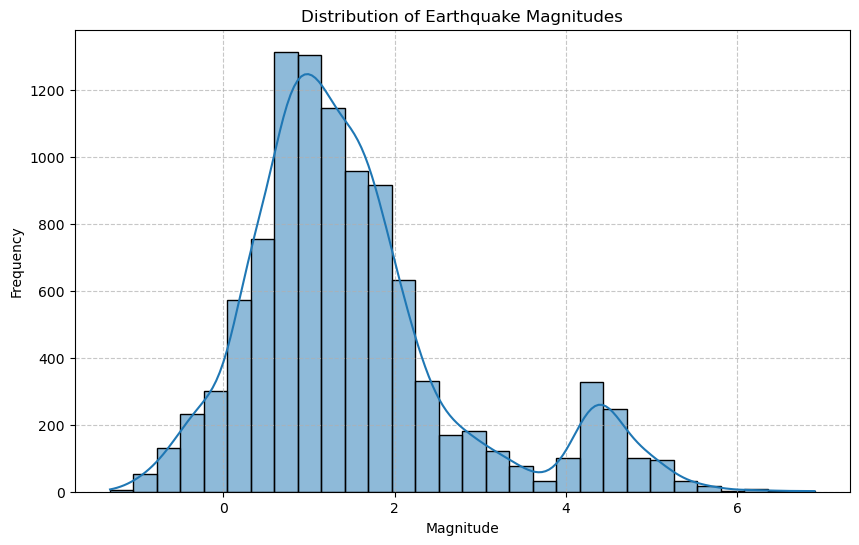

In [17]:
# Distribution of magnitude
plt.figure(figsize=(10, 6))
sns.histplot(df['mag'].dropna(), bins=30, kde=True)
plt.title('Distribution of Earthquake Magnitudes')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('magnitude_distribution.png')

plt.show()

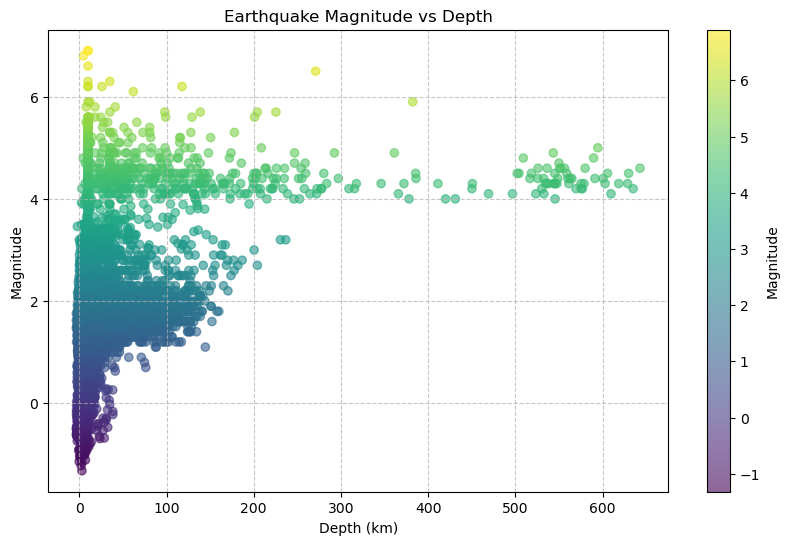

In [18]:
# Magnitude by depth
plt.figure(figsize=(10, 6))
plt.scatter(df['depth'], df['mag'], alpha=0.6, c=df['mag'], cmap='viridis')
plt.colorbar(label='Magnitude')
plt.title('Earthquake Magnitude vs Depth')
plt.xlabel('Depth (km)')
plt.ylabel('Magnitude')
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('magnitude_vs_depth.png')
plt.show()

In [21]:
import folium
from folium.plugins import MarkerCluster

def plot_earthquake_map_jupyter(df):
    # Drop missing values
    df_clean = df.dropna(subset=['latitude', 'longitude', 'mag'])
    
    # Center of the map
    center_lat = df_clean['latitude'].median()
    center_lon = df_clean['longitude'].median()
    earthquake_map = folium.Map(location=[center_lat, center_lon], zoom_start=2, tiles='CartoDB positron')
    
    # Add Marker Cluster
    marker_cluster = MarkerCluster().add_to(earthquake_map)
    
    for _, row in df_clean.iterrows():
        magnitude = row['mag']
        popup_text = f"<b>Location:</b> {row.get('place', 'Unknown')}<br><b>Magnitude:</b> {magnitude}"
        
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=3 + magnitude,
            color='red' if magnitude >= 5 else 'orange',
            fill=True,
            fill_opacity=0.7,
            popup=popup_text
        ).add_to(marker_cluster)
    
    return earthquake_map  # ← just return it!
plot_earthquake_map_jupyter(df)


<Figure size 1200x600 with 0 Axes>

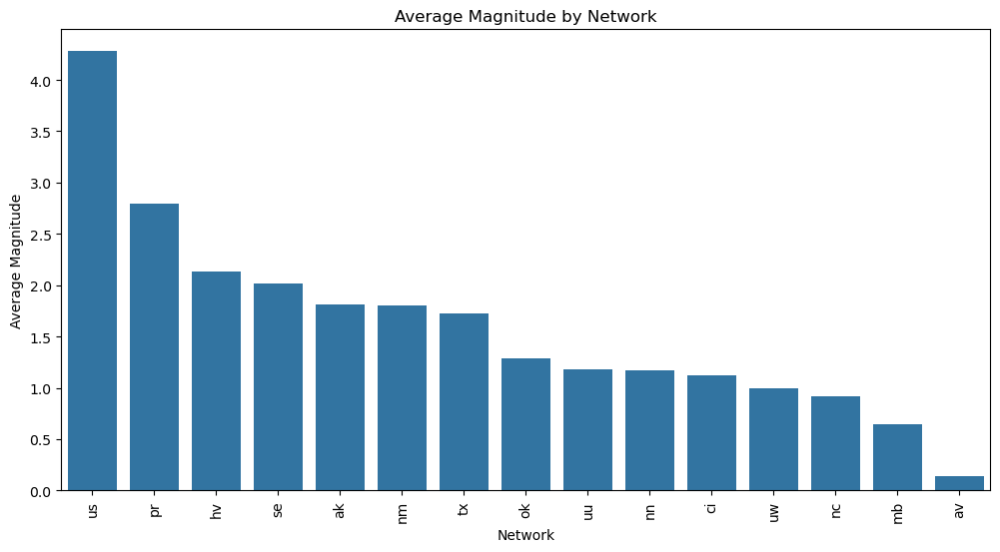

In [22]:
# Magnitude by network
plt.figure(figsize=(12, 6))
network_mag = df.groupby('net')['mag'].mean().sort_values(ascending=False)
network_count = df.groupby('net').size().loc[network_mag.index]

plt.figure(figsize=(12, 6))
ax = sns.barplot(x=network_mag.index, y=network_mag.values)
plt.title('Average Magnitude by Network')
plt.xlabel('Network')
plt.ylabel('Average Magnitude')
plt.xticks(rotation=90)
plt.show()

In [23]:
# Add count labels
for i, (count, mag) in enumerate(zip(network_count, network_mag)):
    ax.text(i, mag + 0.05, f'n={count}', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.savefig('magnitude_by_network.png')
plt.show()

<Figure size 640x480 with 0 Axes>

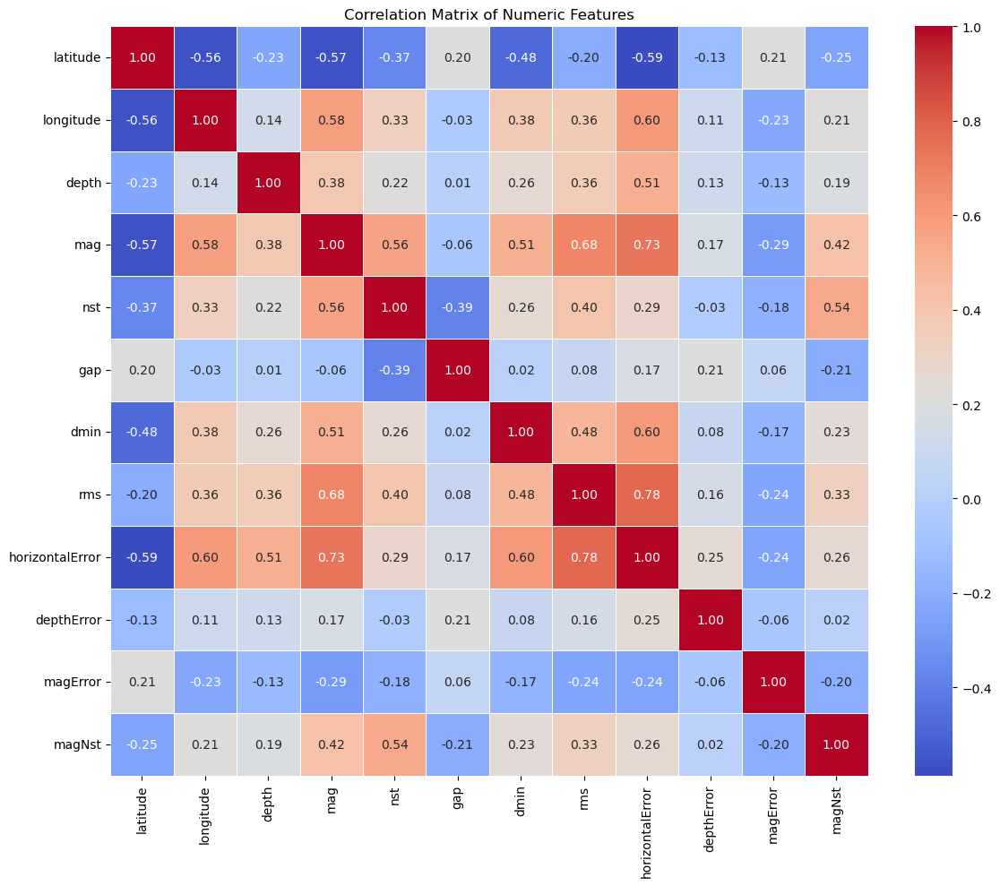

In [24]:
# Correlation analysis
numeric_df = df.select_dtypes(include=[np.number])
correlation = numeric_df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix of Numeric Features')
plt.tight_layout()
plt.savefig('correlation_matrix.png')
plt.show()


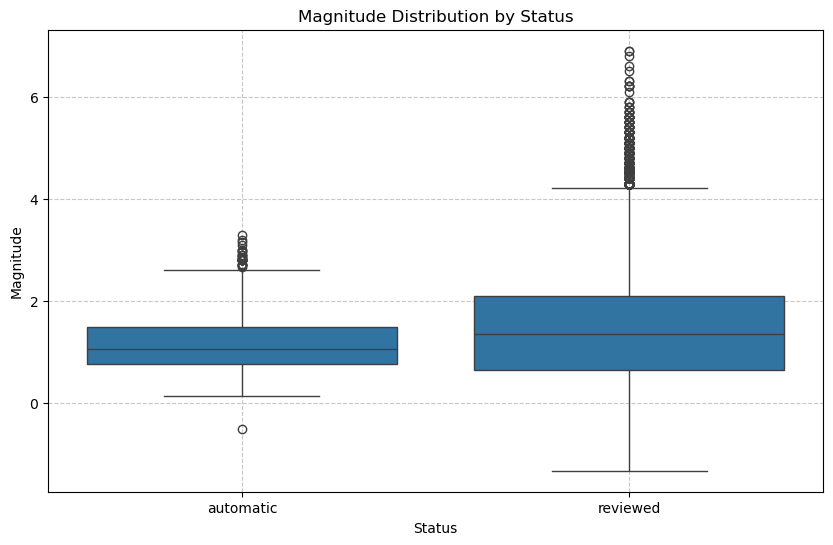

In [25]:

# Status analysis by magnitude
plt.figure(figsize=(10, 6))
sns.boxplot(x='status', y='mag', data=df)
plt.title('Magnitude Distribution by Status')
plt.xlabel('Status')
plt.ylabel('Magnitude')
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('status_magnitude.png')
plt.show()

<Figure size 1000x600 with 0 Axes>

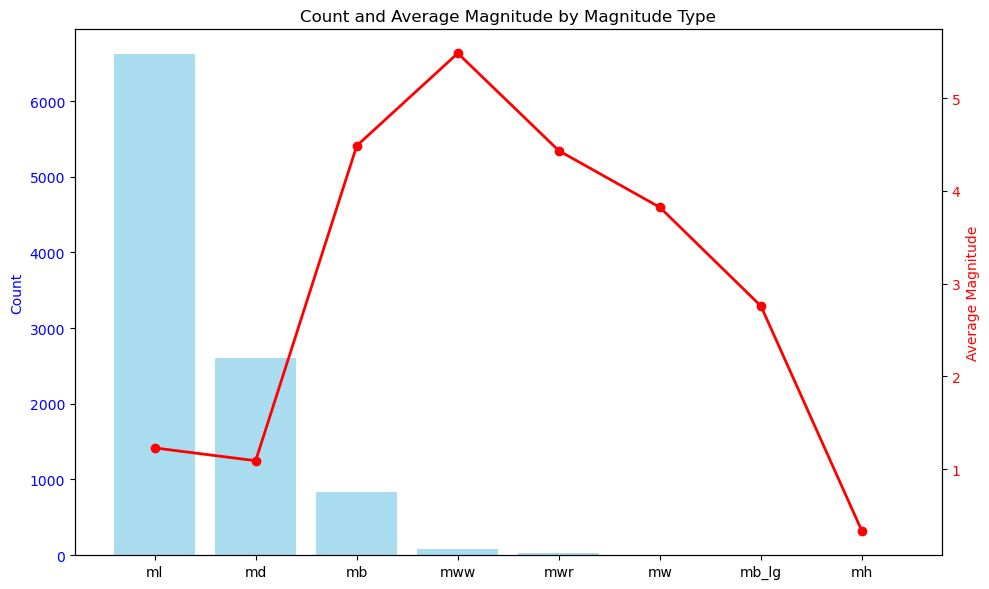

In [26]:
# Magnitude type analysis
plt.figure(figsize=(10, 6))
mag_type_count = df['magType'].value_counts()
mag_type_avg = df.groupby('magType')['mag'].mean().loc[mag_type_count.index]

fig, ax1 = plt.subplots(figsize=(10, 6))
ax2 = ax1.twinx()

bars = ax1.bar(mag_type_count.index, mag_type_count.values, alpha=0.7, color='skyblue')
ax1.set_ylabel('Count', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

line = ax2.plot(mag_type_count.index, mag_type_avg.values, 'ro-', linewidth=2)
ax2.set_ylabel('Average Magnitude', color='red')
ax2.tick_params(axis='y', labelcolor='red')

plt.title('Count and Average Magnitude by Magnitude Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('magtype_analysis.png')
plt.show()

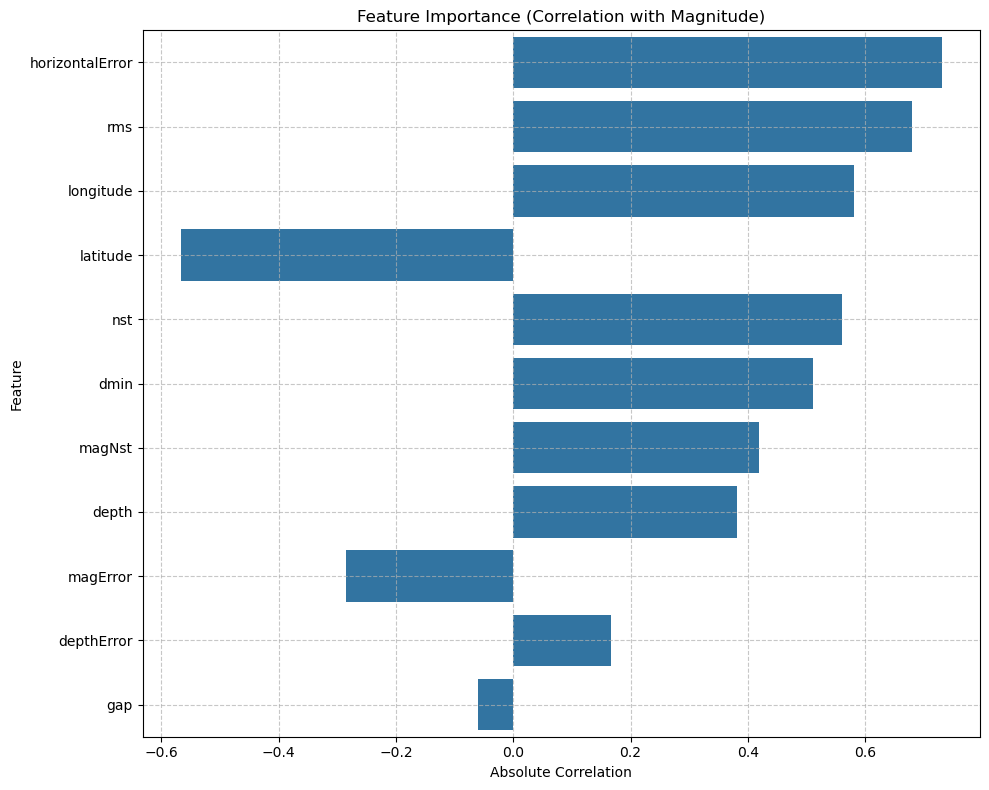

In [27]:

# Feature importance analysis based on correlation with magnitude
importance_df = pd.DataFrame({
    'Feature': correlation['mag'].drop('mag').index,
    'Correlation': correlation['mag'].drop('mag').values.round(3)
})
importance_df = importance_df.sort_values('Correlation', key=abs, ascending=False)

plt.figure(figsize=(10, 8))
sns.barplot(x='Correlation', y='Feature', data=importance_df)
plt.title('Feature Importance (Correlation with Magnitude)')
plt.xlabel('Absolute Correlation')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('feature_importance.png')
plt.show()

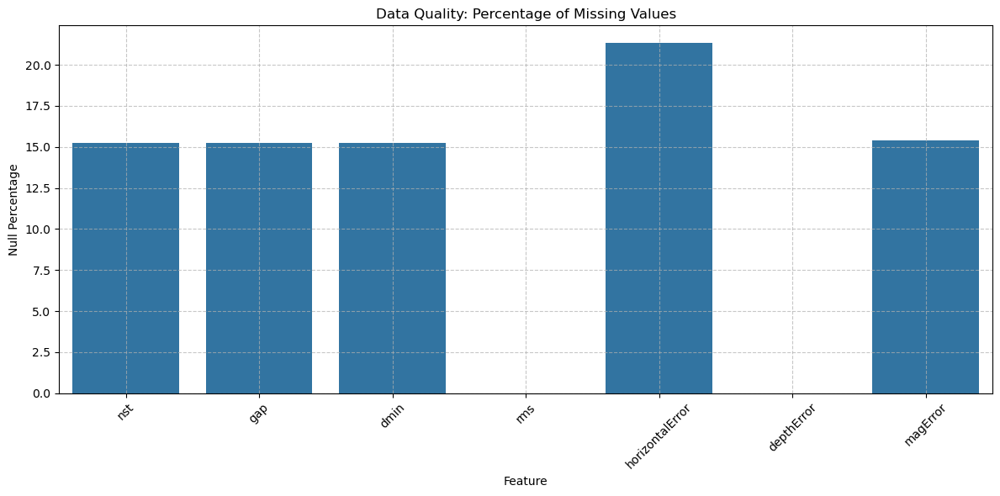

In [28]:
# Data quality analysis
quality_metrics = pd.DataFrame({
    'Feature': ['nst', 'gap', 'dmin', 'rms', 'horizontalError', 'depthError', 'magError'],
    'Non-null Count': [df[col].count() for col in ['nst', 'gap', 'dmin', 'rms', 'horizontalError', 'depthError', 'magError']],
    'Null Percentage': [(1 - df[col].count()/len(df))*100 for col in ['nst', 'gap', 'dmin', 'rms', 'horizontalError', 'depthError', 'magError']]
})

plt.figure(figsize=(12, 6))
sns.barplot(x='Feature', y='Null Percentage', data=quality_metrics)
plt.title('Data Quality: Percentage of Missing Values')
plt.xlabel('Feature')
plt.ylabel('Null Percentage')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('data_quality.png')
plt.show()

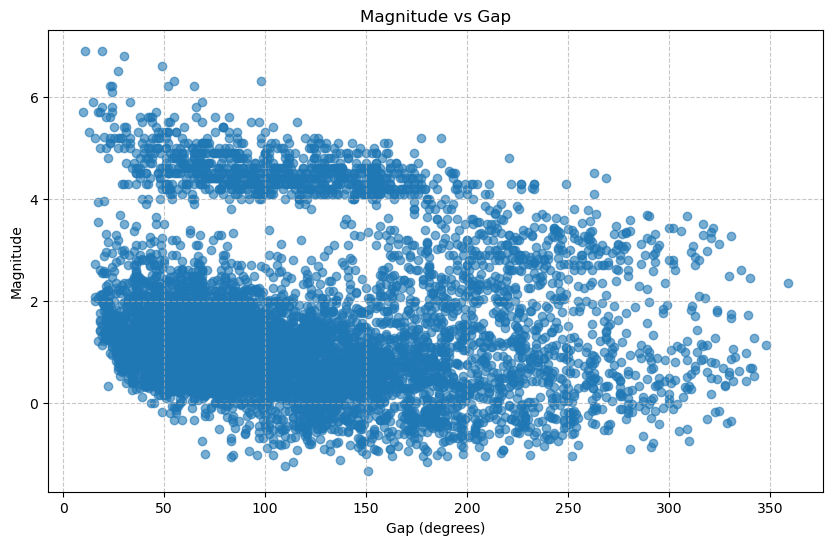

In [30]:
# Magnitude and Gap relationship
plt.figure(figsize=(10, 6))
plt.scatter(df['gap'], df['mag'], alpha=0.6)
plt.title('Magnitude vs Gap')
plt.xlabel('Gap (degrees)')
plt.ylabel('Magnitude')
plt.grid(True, linestyle='--', alpha=0.7)
plt.savefig('magnitude_gap.png')
plt.show()


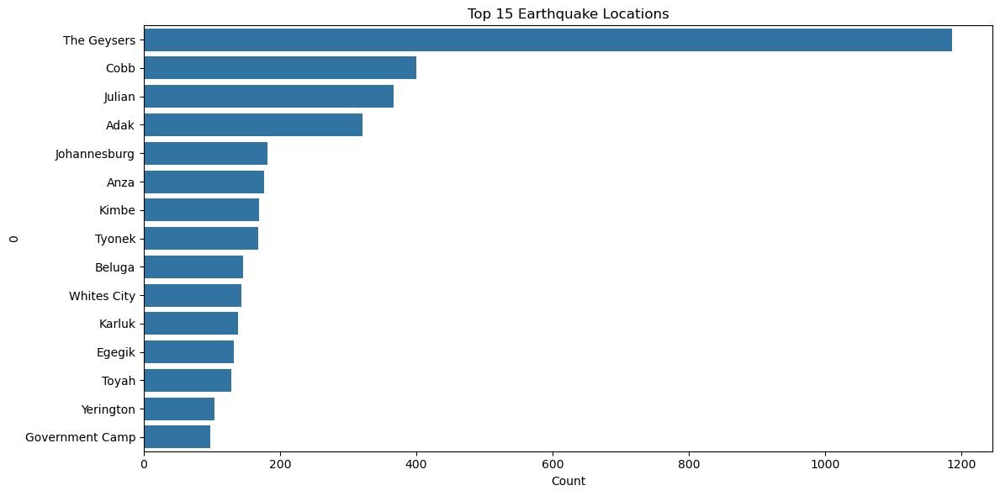

In [31]:
# Location analysis - top locations by frequency
top_locations = df['place'].str.extract(r'of (.*?),')[0].dropna().value_counts().head(15)

plt.figure(figsize=(12, 6))
sns.barplot(x=top_locations.values, y=top_locations.index)
plt.title('Top 15 Earthquake Locations')
plt.xlabel('Count')
plt.tight_layout()
plt.savefig('top_locations.png')
plt.show()

In [32]:
# Key findings summary
print("\nKey Findings:")
print(f"1. Total earthquakes recorded: {len(df)}")
print(f"2. Magnitude range: {df['mag'].min():.1f} to {df['mag'].max():.1f}")
print(f"3. Mean magnitude: {df['mag'].mean():.2f}")
print(f"4. Most active network: {df['net'].value_counts().idxmax()} with {df['net'].value_counts().max()} events")
print(f"5. Percentage of reviewed events: {df['status'].value_counts(normalize=True).get('reviewed', 0)*100:.1f}%")
print(f"6. Most common magnitude type: {df['magType'].value_counts().idxmax()}")
print(f"7. Average depth: {df['depth'].mean():.2f} km")
print(f"8. Correlation between depth and magnitude: {correlation.loc['depth', 'mag']:.3f}")


Key Findings:
1. Total earthquakes recorded: 10177
2. Magnitude range: -1.3 to 6.9
3. Mean magnitude: 1.50
4. Most active network: nc with 2194 events
5. Percentage of reviewed events: 78.3%
6. Most common magnitude type: ml
7. Average depth: 20.44 km
8. Correlation between depth and magnitude: 0.382
